# Three-major-institutions flow signals on MXF — **daily bars**

TAIFEX 三大法人 daily flow data (foreign / 投信 / 自營商) used as factors on the **daily** MXF asset.

## Why daily bars (not 1-minute)?

The 三大法人 report is published **after market close** on date D — roughly 15:00 TPE. So the published OI / net-trade labeled `date = D` is knowable at D's close; the earliest a trade can use it is D+1's open.

On **daily bars**, `cta.Simulate` applies `signal.shift(2)` internally:
* signal[D] computed from D's after-close OI publication
* exec_sig[D+2] = signal[D] (i.e. position taken at D+1 open, based on D's data)
* pnl[D+2] = exec_sig[D+2] × close.pct_change()[D+2] = D+1 → D+2 return

→ **PIT-safe by construction**, no extra lag needed.

(On 1m bars, broadcasting D's value across every minute of D leaks information into the 08:46–14:59 window — that's where the +4.5 SR artefact came from in the earlier minute-bar attempt.)

**In-sample**: 2023-06-26 → 2025-12-31. **OOS**: 2026-01-01 → present.

In [9]:
import importlib, sys, warnings
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# Silence the "findfont: font family '…' not found" spam, then keep only
# fonts actually installed on this machine.
warnings.filterwarnings("ignore", message="findfont: .* not found")
_installed = {f.name for f in fm.fontManager.ttflist}
_candidates = ["Hiragino Sans GB","Heiti TC","Songti SC",
               "PingFang HK","PingFang SC","PingFang TC",
               "Arial Unicode MS","Noto Sans CJK TC","DejaVu Sans"]
mpl.rcParams["font.family"] = [f for f in _candidates if f in _installed] or ["DejaVu Sans"]
mpl.rcParams["axes.unicode_minus"] = False

import cta
for _m in ["cta.asset","cta.operators","cta.simulate","cta.three_majors"]:
    if _m in sys.modules: importlib.reload(sys.modules[_m])
importlib.reload(cta)

IN_SAMPLE_START = "2023-06-26"
IN_SAMPLE_END   = "2025-12-31"
OUT_OF_SAMPLE_END = "2026-06-26"
cta.set_date_range(start_date=IN_SAMPLE_START, end_date=OUT_OF_SAMPLE_END)

ASSET = cta.load_asset("mtx", "1d")              # ← daily bars
cta.set_active_asset(ASSET)

print(f"asset       : {ASSET.symbol}  {ASSET.time_granularity}  {len(ASSET):,} bars")
print(f"window      : {ASSET.index[0]} → {ASSET.index[-1]}")
print(f"eval window : {cta.get_date_range()}")
print(f"periods/yr  : {ASSET.periods_per_year}")

asset       : MTX  1d  6,210 bars
window      : 2001-04-09 00:00:00 → 2026-06-26 00:00:00
eval window : (Timestamp('2023-06-26 00:00:00'), Timestamp('2026-06-26 00:00:00'))
periods/yr  : 252


## Helpers — daily evaluate / summarize

Mirrors `cta.Simulate`'s internal maths: `exec_sig = signal.shift(2)`, `pnl = exec_sig × close.pct_change()`, costs on `|Δexec_sig|`.

In [10]:
POINT_VALUE    = 50.0
FIXED_PER_SIDE = 20.0
FEE_RATE       = 0.00002
PERIODS_PER_YR = ASSET.periods_per_year

def evaluate(daily_sig, asset=ASSET, start=IN_SAMPLE_START, end=IN_SAMPLE_END):
    sig = daily_sig.reindex(asset.index).astype(float)
    exec_sig = sig.shift(2)                              # PIT-safe daily lag
    ret      = asset["close"].pct_change()
    pnl      = (exec_sig * ret).rename("pnl")
    turnover = exec_sig.fillna(0).diff().abs()
    cost_pct = FIXED_PER_SIDE / (asset["close"] * POINT_VALUE) + FEE_RATE
    tcost    = turnover * cost_pct
    pnl_net  = pnl - tcost
    pnl, pnl_net = pnl.loc[start:end], pnl_net.loc[start:end]
    exec_s = exec_sig.loc[start:end]
    def sr(s):
        s = s.dropna()
        return (np.sqrt(PERIODS_PER_YR) * s.mean() / s.std()) if s.std() > 0 else float("nan")
    return {
        "SR_gross":      sr(pnl),
        "SR_net":        sr(pnl_net),
        "cum_gross_pct": float(pnl.fillna(0).sum())     * 100,
        "cum_net_pct":   float(pnl_net.fillna(0).sum()) * 100,
        "held_pct":      float((exec_s.abs() > 0.01).mean()) * 100,
        "turnover_avg":  float(turnover.loc[start:end].fillna(0).mean()),
    }

def summarize(rows):
    df = pd.DataFrame({n: evaluate(s) for n, s in rows.items()}).T
    return df.round(3).sort_values("SR_net", ascending=False)

print("helpers ready.")

helpers ready.


## Quick look — net OI / net trade by identity

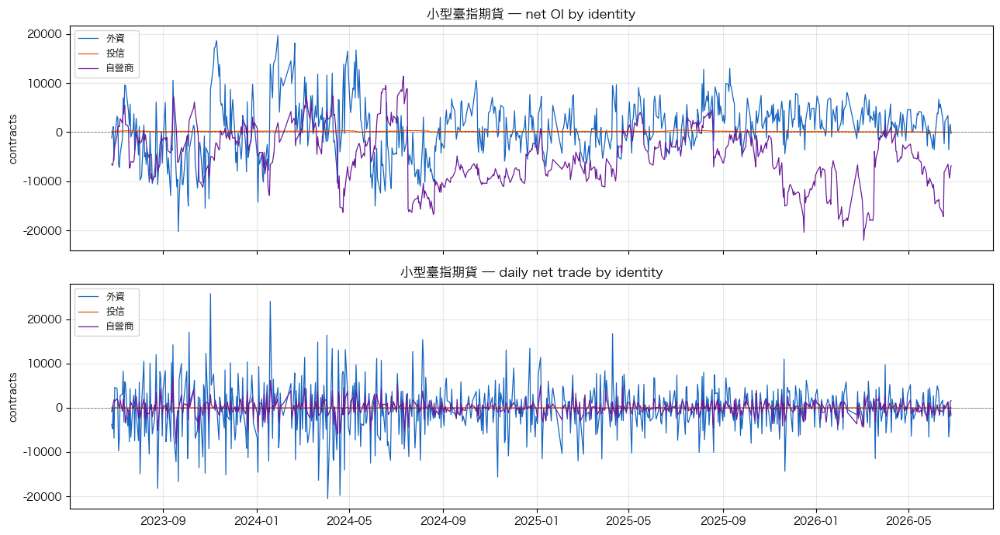

identity,外資,投信,自營商
date,,,
2026-06-22,3381,22,-6499
2026-06-23,-3553,20,-8002
2026-06-24,882,19,-9370
2026-06-25,1615,19,-8098
2026-06-26,-268,13,-6807


In [11]:
PRODUCT = "小型臺指期貨"     # MXF

oi_wide    = cta.load_three_majors_wide(PRODUCT, "oi_net_lots", identities=["外資","投信","自營商"])
trade_wide = cta.load_three_majors_wide(PRODUCT, "net_lots",    identities=["外資","投信","自營商"])

fig, axes = plt.subplots(2, 1, figsize=(13, 7), sharex=True)
for ax, df, ttl in [(axes[0], oi_wide,    f"{PRODUCT} — net OI by identity"),
                    (axes[1], trade_wide, f"{PRODUCT} — daily net trade by identity")]:
    for c, color in zip(df.columns, ["#1565c0","#e65100","#6a1b9a"]):
        ax.plot(df.index, df[c], lw=0.9, color=color, label=c)
    ax.axhline(0, color="black", lw=0.6, ls="--", alpha=0.5)
    ax.set_title(ttl); ax.set_ylabel("contracts")
    ax.legend(loc="upper left", fontsize=9); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

display(oi_wide.tail(5))

## 1. Raw foreign-OI z-score — continuation vs fade

,SR_gross,SR_net,cum_gross_pct,cum_net_pct,held_pct,turnover_avg
fi_oi_fade,0.067,0.033,2.184,1.071,97.565,0.463
fi_oi_cont,-0.067,-0.101,-2.184,-3.297,97.565,0.463
fi_oi_z_sign,-0.989,-1.017,-52.842,-54.360,98.214,0.635


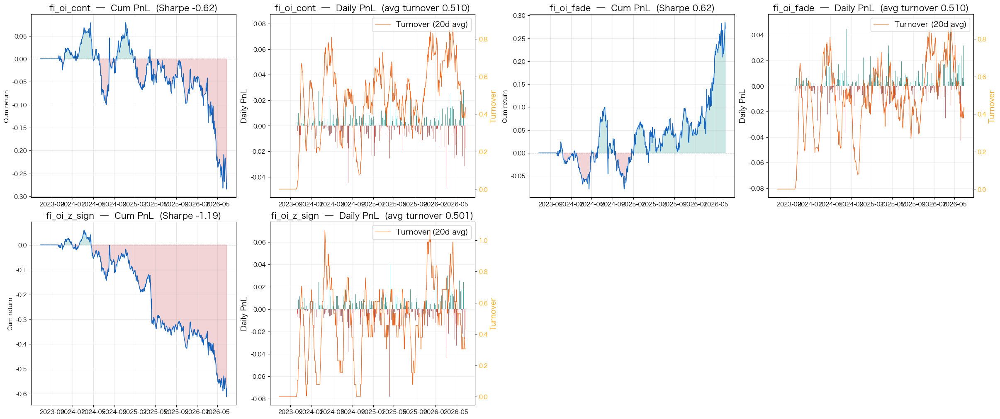

In [12]:
fi_oi = cta.load_three_majors(PRODUCT, "外資", "oi_net_lots").astype(float)

z   = (fi_oi - fi_oi.rolling(60, min_periods=10).mean()) / fi_oi.rolling(60, min_periods=10).std()
raw = np.tanh(z)
z_sign = cta.Sign(z)

raw_signals = {
    "fi_oi_cont":  raw.rename("fi_oi_cont"),
    "fi_oi_fade": (-raw).rename("fi_oi_fade"),
    "fi_oi_z_sign": z_sign.rename("fi_oi_sin")
}
display(summarize(raw_signals))

cta.SimulateAll(*raw_signals.values(), names=list(raw_signals.keys()),
                time_granularity="1d", normalize=True)

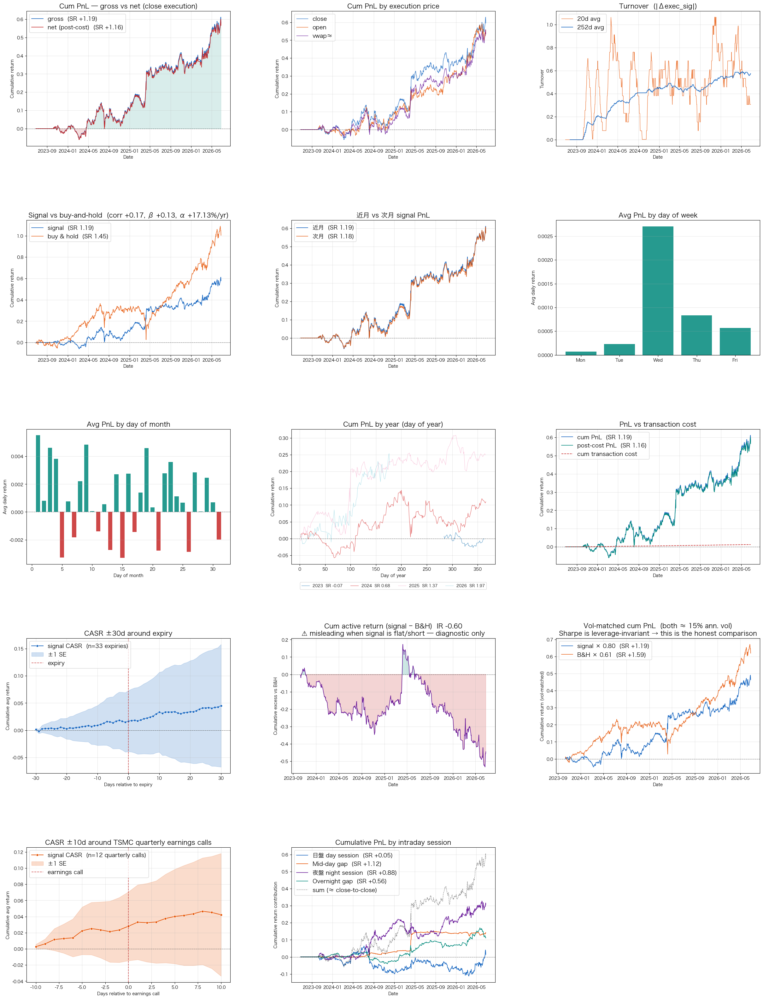

In [13]:
result_bh = cta.simulate(-raw_signals['fi_oi_z_sign'], asset="mtx", time_granularity="1d", normalize=True)

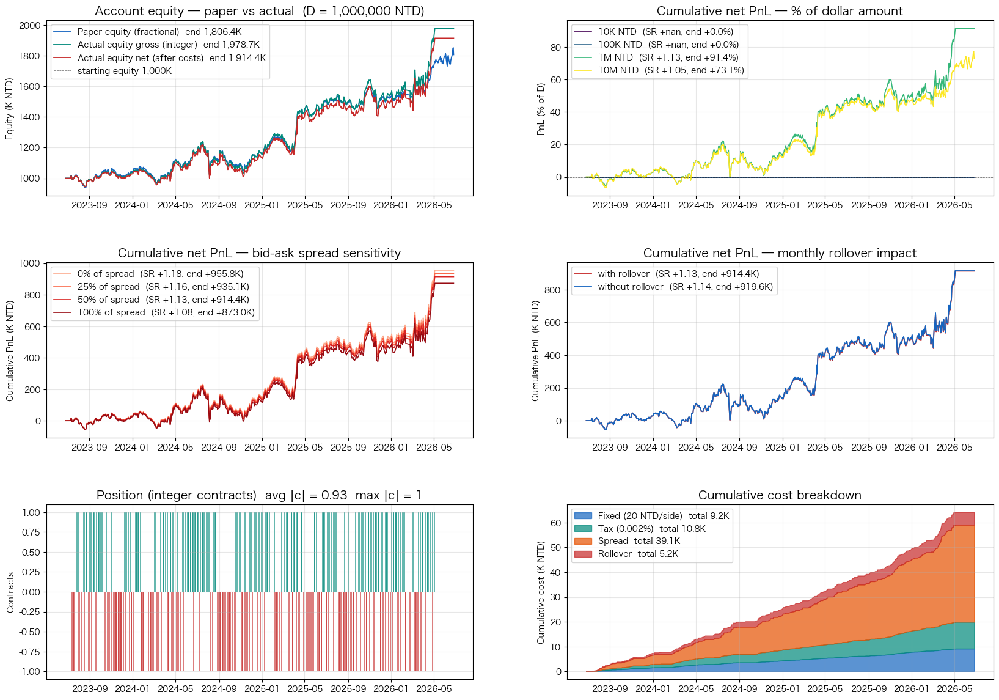

In [14]:
result = cta.simulate_by_dollars(
    -raw_signals['fi_oi_z_sign'],
    dollar_amount   = 1_000_000,   # NTD account size
    time_granularity= "1d",
    normalize       = False,       # signal is already in [-1, +1]
    spread_fraction = 0.5,         # half the bid-ask spread per trade
    include_rollover= True,        # charge round-trip costs on monthly expiry
)

## 2. Smoothed OI — `InstMean(N, ...)` at multiple daily windows

,SR_gross,SR_net,cum_gross_pct,cum_net_pct,held_pct,turnover_avg
fi_oi_ma60d_cont,0.973,0.971,40.639,40.560,85.227,0.033
fi_oi_ma20d_cont,0.565,0.561,19.415,19.256,87.987,0.067
fi_oi_ma3d_cont,0.279,0.263,8.852,8.367,89.773,0.204
fi_oi_ma10d_fade,0.167,0.160,5.537,5.308,88.474,0.096
fi_oi_ma5d_cont,0.124,0.113,4.050,3.699,89.123,0.148
fi_oi_ma5d_fade,-0.124,-0.135,-4.050,-4.400,89.123,0.148
fi_oi_ma10d_cont,-0.167,-0.174,-5.537,-5.766,88.474,0.096
fi_oi_ma3d_fade,-0.279,-0.294,-8.852,-9.338,89.773,0.204
fi_oi_ma20d_fade,-0.565,-0.570,-19.415,-19.575,87.987,0.067
fi_oi_ma60d_fade,-0.973,-0.975,-40.639,-40.718,85.227,0.033


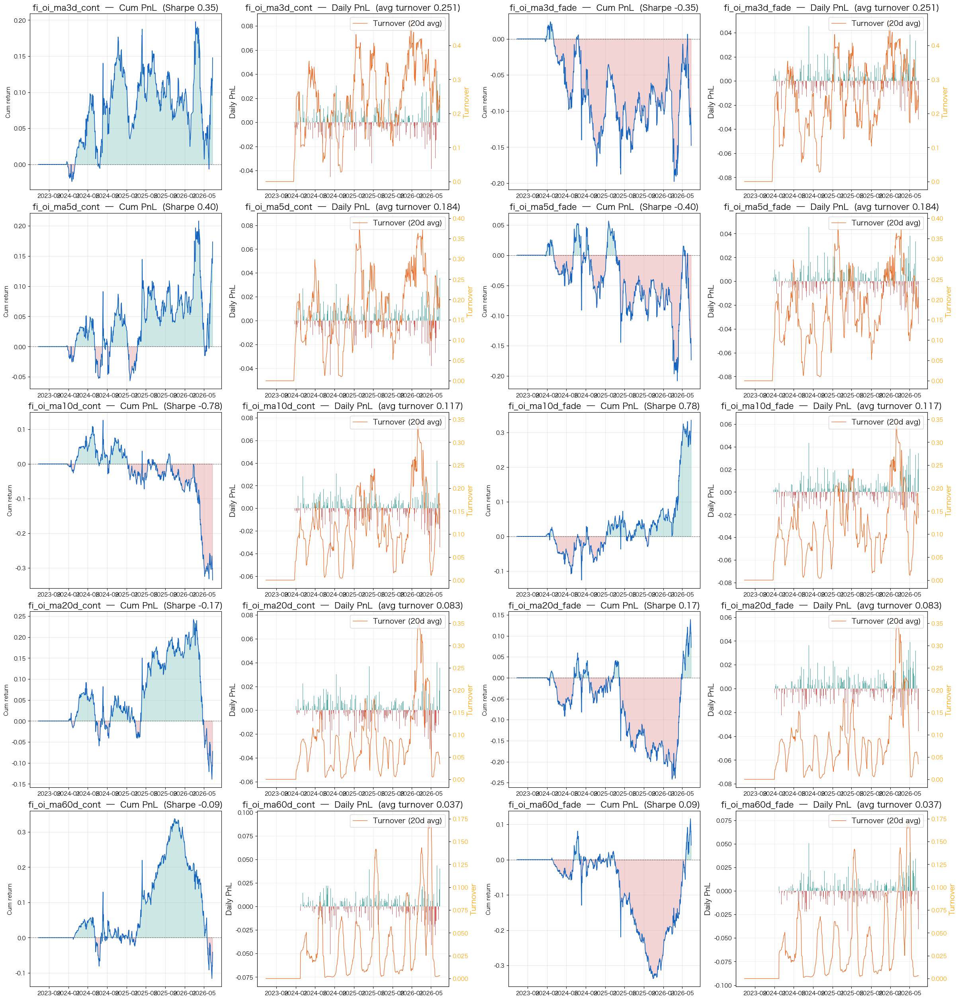

In [15]:
WINDOWS_D = [3, 5, 10, 20, 60]

smoothed_signals = {}
for N in WINDOWS_D:
    smooth = cta.InstMean(N, fi_oi)
    z      = (smooth - smooth.rolling(60).mean()) / smooth.rolling(60).std()
    sig_d  = np.tanh(z)
    smoothed_signals[f"fi_oi_ma{N}d_cont"] =  sig_d.rename(f"fi_oi_ma{N}d_cont")
    smoothed_signals[f"fi_oi_ma{N}d_fade"] = (-sig_d).rename(f"fi_oi_ma{N}d_fade")

display(summarize(smoothed_signals))
cta.SimulateAll(*smoothed_signals.values(), names=list(smoothed_signals.keys()),
                time_granularity="1d", normalize=True)

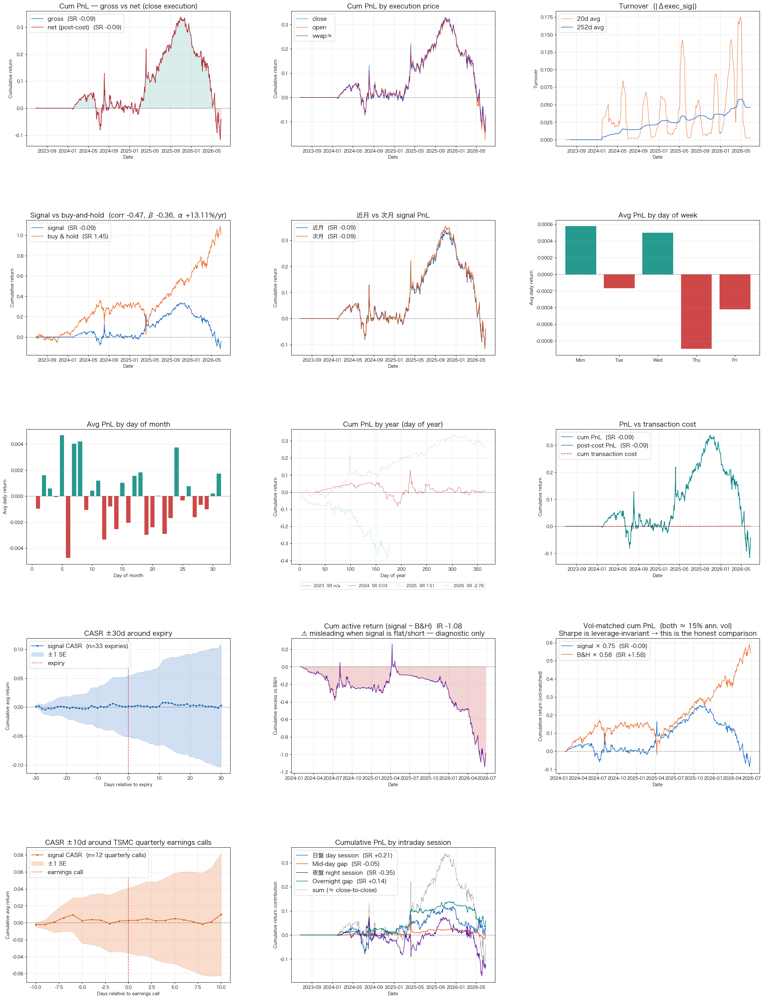

In [16]:
result_bh = cta.simulate(smoothed_signals['fi_oi_ma60d_cont'], asset="mtx", time_granularity="1d", normalize=True)

## 3. Daily net trade per identity

,SR_gross,SR_net,cum_gross_pct,cum_net_pct,held_pct,turnover_avg
net_自營商_fade,0.600,0.546,19.899,18.101,98.214,0.747
net_投信_fade,0.371,0.325,10.530,9.225,80.357,0.541
net_外資_fade,0.129,0.066,4.009,2.052,98.539,0.812
net_外資_cont,-0.129,-0.193,-4.009,-5.966,98.539,0.812
net_投信_cont,-0.371,-0.417,-10.530,-11.834,80.357,0.541
net_自營商_cont,-0.600,-0.654,-19.899,-21.697,98.214,0.747


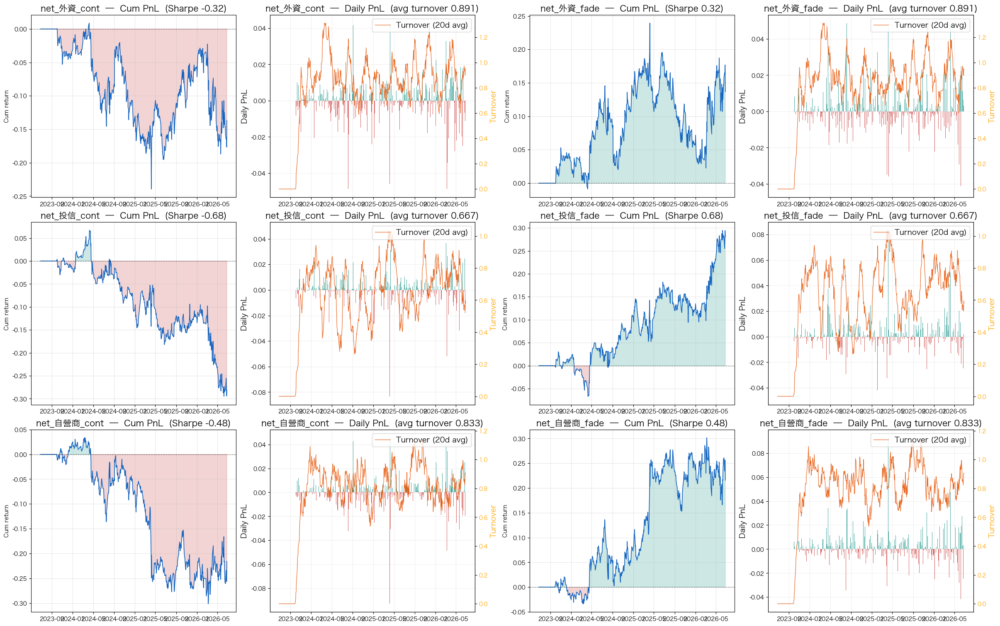

In [17]:
trade_signals = {}
for who in ["外資", "投信", "自營商"]:
    net   = cta.load_three_majors(PRODUCT, who, "net_lots").astype(float)
    sd    = net.rolling(20, min_periods=5).std()
    sig_d = np.tanh(net / sd)
    trade_signals[f"net_{who}_cont"] =  sig_d.rename(f"net_{who}_cont")
    trade_signals[f"net_{who}_fade"] = (-sig_d).rename(f"net_{who}_fade")

display(summarize(trade_signals))
cta.SimulateAll(*trade_signals.values(), names=list(trade_signals.keys()),
                time_granularity="1d", normalize=True)

## 4. `InstSkew` of OI changes — distribution-tail bursts

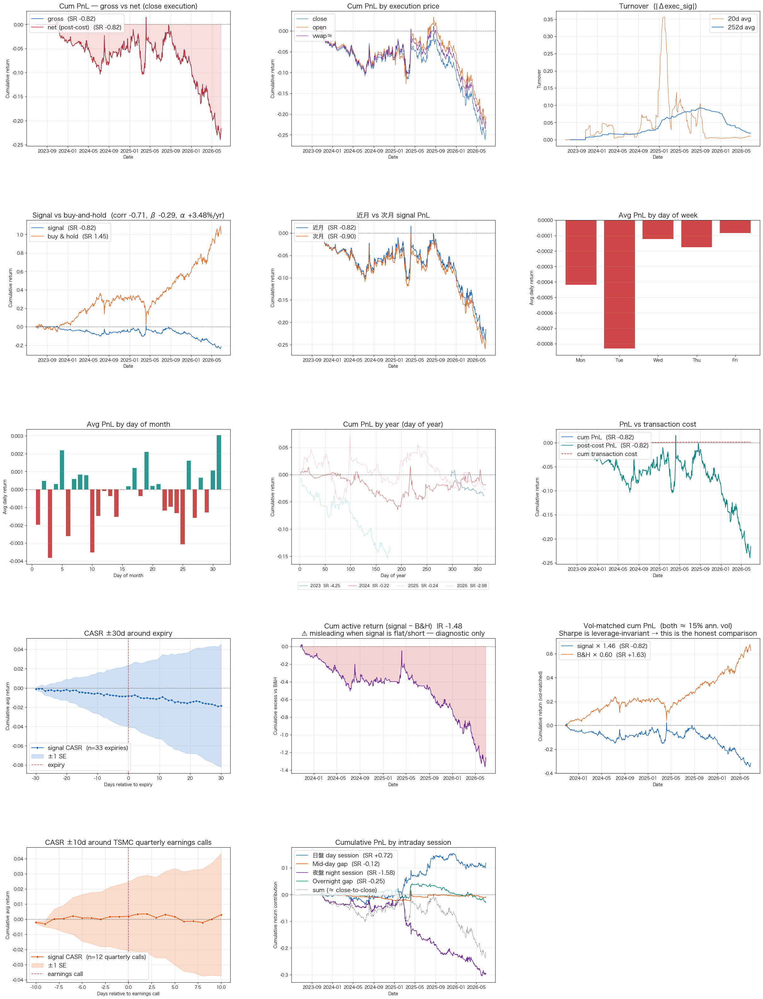

In [18]:
oi_chg = -cta.InstMean(20, (fi_oi-cta.InstMean(20, fi_oi))/cta.InstMean(20, fi_oi))
result_bh = cta.simulate(oi_chg, asset="mtx", time_granularity="1d", normalize=True)

,SR_gross,SR_net,cum_gross_pct,cum_net_pct,held_pct,turnover_avg
fi_oichg_skew10d_cont,1.421,1.401,33.149,32.692,98.052,0.189
fi_oichg_skew240d_cont,1.346,1.342,7.401,7.382,79.058,0.008
fi_oichg_skew120d_cont,0.875,0.870,6.672,6.631,86.688,0.018
fi_oichg_skew20d_cont,0.790,0.776,13.513,13.273,97.565,0.100
fi_oichg_skew60d_cont,0.533,0.528,8.133,8.048,91.234,0.036
fi_oichg_skew5d_cont,0.056,0.028,1.814,0.906,98.214,0.378


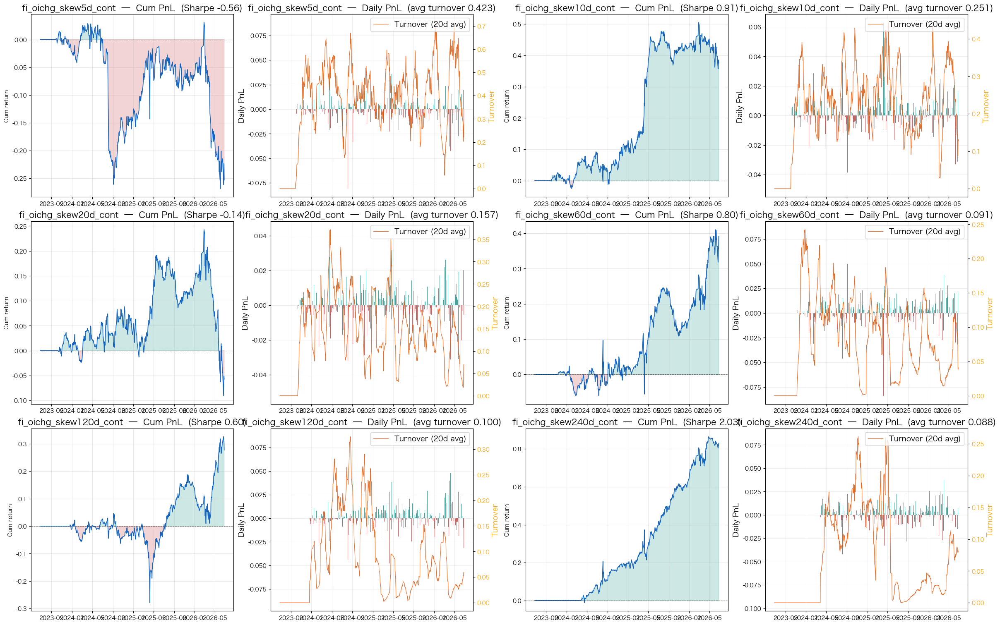

In [19]:
oi_chg = fi_oi.diff()

skew_signals = {}
for N in [5, 10, 20, 60, 120, 240]:
    sk    = cta.InstSkew(N, oi_chg)
    sig_d = np.tanh(sk)
    skew_signals[f"fi_oichg_skew{N}d_cont"] =  -sig_d.rename(f"fi_oichg_skew{N}d_cont")

display(summarize(skew_signals))
cta.SimulateAll(*skew_signals.values(), names=list(skew_signals.keys()),
                time_granularity="1d", normalize=True)

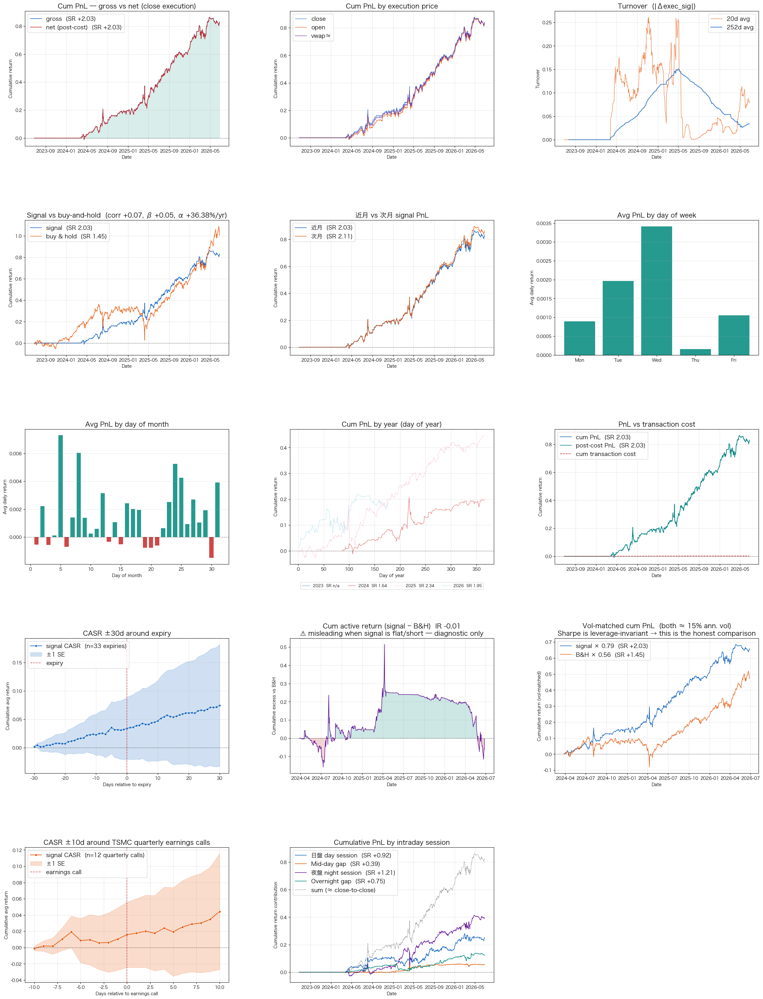

In [20]:
result_bh = cta.simulate(skew_signals['fi_oichg_skew240d_cont'], asset="mtx", time_granularity="1d", normalize=True)

<Axes: >

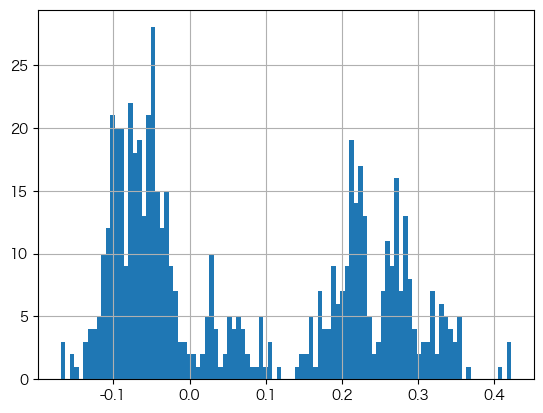

In [21]:
skew_signals['fi_oichg_skew240d_cont'].dropna().hist(bins=100)

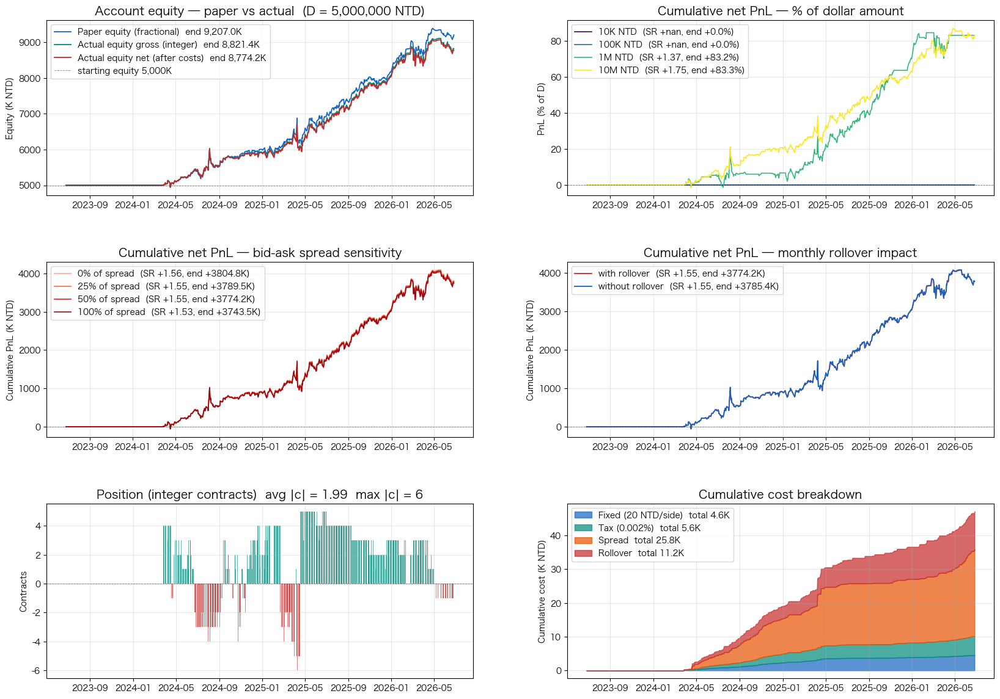

In [22]:
result = cta.simulate_by_dollars(
    skew_signals['fi_oichg_skew240d_cont'],
    dollar_amount   = 5_000_000,   # NTD account size
    time_granularity= "1d",
    normalize       = True,       # signal is already in [-1, +1]
    spread_fraction = 0.5,         # half the bid-ask spread per trade
    include_rollover= True,        # charge round-trip costs on monthly expiry
)

<Axes: >

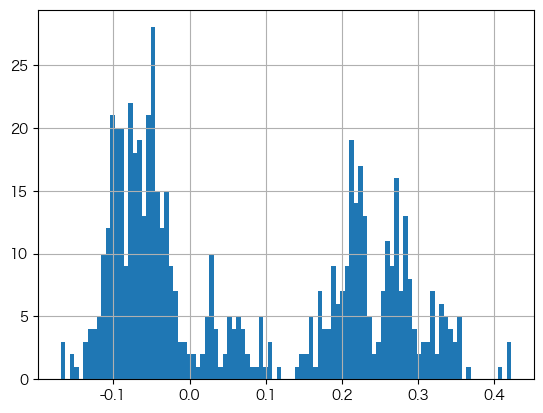

In [23]:
skew_signals['fi_oichg_skew240d_cont'].dropna().hist(bins=100)

## 5. `InstRank > 0.98` — fire only on extreme-tail days

Binary `±1` on days when each identity's daily net-trade is in the top 2% (or bottom 2%) of its trailing 120-day distribution. Held for one day each fire.

### Raw InstRank

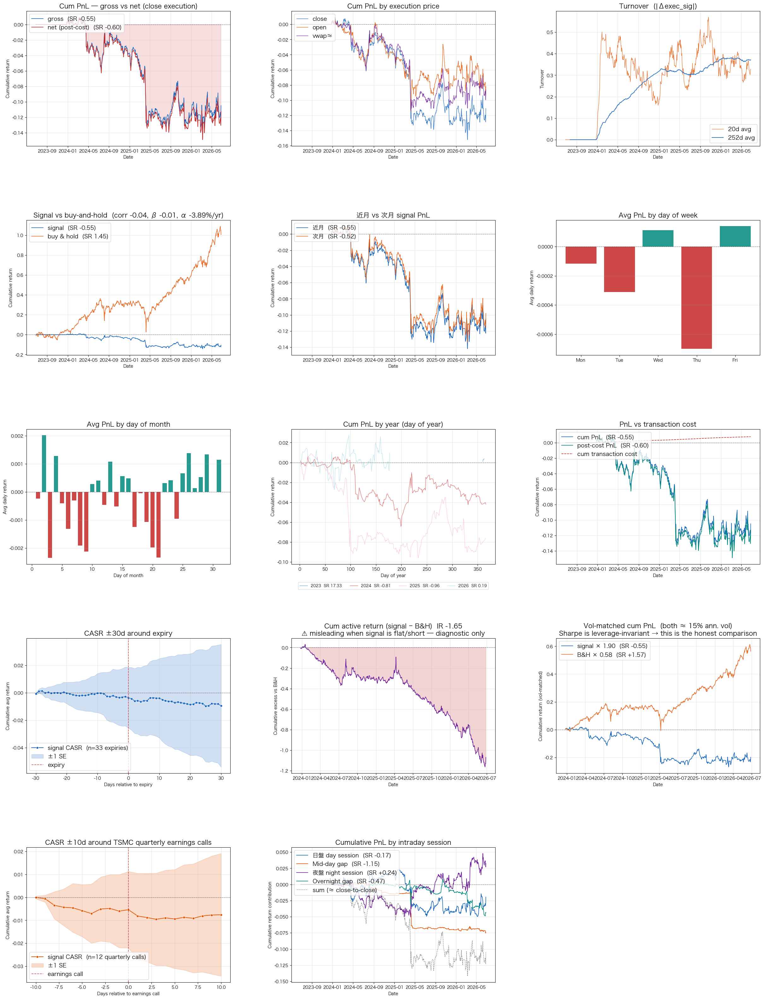

In [24]:
forieign_oi = cta.load_three_majors(PRODUCT, "自營商", "net_lots").astype(float)
inst_rank_sig = cta.InstRank(252, forieign_oi) - 0.5
result_bh = cta.simulate(inst_rank_sig, asset="mtx", time_granularity="1d", normalize=False)

days firing per signal:
  外資_hi_cont            10 of 730 days
  外資_hi_fade            10 of 730 days
  外資_lo_cont            13 of 730 days
  外資_lo_fade            13 of 730 days
  投信_hi_cont            19 of 730 days
  投信_hi_fade            19 of 730 days
  投信_lo_cont            15 of 730 days
  投信_lo_fade            15 of 730 days
  自營商_hi_cont           14 of 730 days
  自營商_hi_fade           14 of 730 days
  自營商_lo_cont           23 of 730 days
  自營商_lo_fade           23 of 730 days


,SR_gross,SR_net,cum_gross_pct,cum_net_pct,held_pct,turnover_avg
投信_hi_fade,0.972,0.962,7.788,7.702,2.110,0.036
投信_lo_fade,0.949,0.941,8.865,8.780,2.110,0.036
外資_hi_cont,0.843,0.833,5.734,5.663,1.461,0.029
自營商_lo_fade,0.747,0.735,7.276,7.152,3.084,0.052
自營商_hi_fade,0.529,0.523,9.092,8.993,2.110,0.042
外資_lo_fade,0.081,0.070,0.592,0.514,1.623,0.032
外資_lo_cont,-0.081,-0.092,-0.592,-0.671,1.623,0.032
自營商_hi_cont,-0.529,-0.535,-9.092,-9.192,2.110,0.042
自營商_lo_cont,-0.747,-0.759,-7.276,-7.400,3.084,0.052
外資_hi_fade,-0.843,-0.852,-5.734,-5.805,1.461,0.029


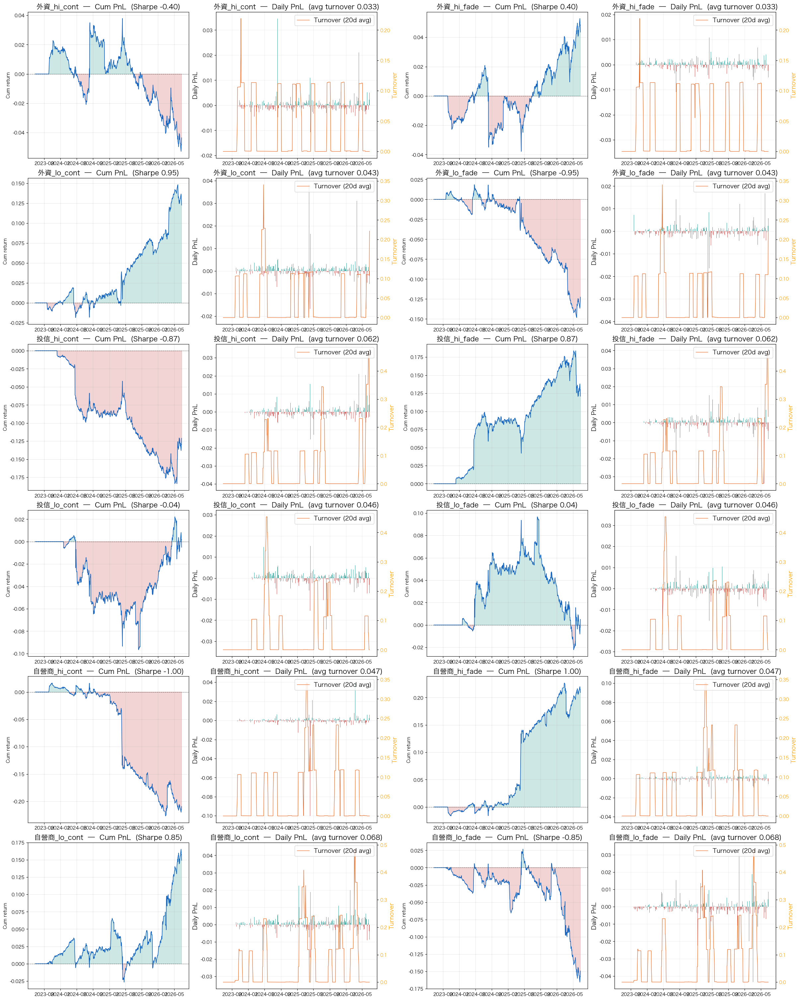

In [25]:
WINDOW_R = 120
THRESH   = 0.98

extreme_signals = {}
for who in ["外資", "投信", "自營商"]:
    net = cta.load_three_majors(PRODUCT, who, "net_lots").astype(float)

    rank_hi = cta.InstRank(WINDOW_R,  net)
    rank_lo = cta.InstRank(WINDOW_R, -net)

    hi_event = (rank_hi > THRESH).astype(float)
    lo_event = (rank_lo > THRESH).astype(float)

    extreme_signals[f"{who}_hi_cont"] =  hi_event.rename(f"{who}_hi_cont")
    extreme_signals[f"{who}_hi_fade"] = (-hi_event).rename(f"{who}_hi_fade")
    extreme_signals[f"{who}_lo_cont"] = (-lo_event).rename(f"{who}_lo_cont")
    extreme_signals[f"{who}_lo_fade"] =  lo_event.rename(f"{who}_lo_fade")

print("days firing per signal:")
for k, v in extreme_signals.items():
    print(f"  {k:20s}  {int(v.abs().sum())} of {v.notna().sum()} days")

display(summarize(extreme_signals))
cta.SimulateAll(*extreme_signals.values(), names=list(extreme_signals.keys()),
                time_granularity="1d", normalize=True)

## 6. Combined sweep + full dashboard for the top signal

,SR_gross,SR_net,cum_gross_pct,cum_net_pct,held_pct,turnover_avg
fi_oichg_skew10d_cont,1.421,1.401,33.149,32.692,98.052,0.189
fi_oichg_skew240d_cont,1.346,1.342,7.401,7.382,79.058,0.008
fi_oi_ma60d_cont,0.973,0.971,40.639,40.560,85.227,0.033
投信_hi_fade,0.972,0.962,7.788,7.702,2.110,0.036
投信_lo_fade,0.949,0.941,8.865,8.780,2.110,0.036
fi_oichg_skew120d_cont,0.875,0.870,6.672,6.631,86.688,0.018
外資_hi_cont,0.843,0.833,5.734,5.663,1.461,0.029
fi_oichg_skew20d_cont,0.790,0.776,13.513,13.273,97.565,0.100
自營商_lo_fade,0.747,0.735,7.276,7.152,3.084,0.052
fi_oi_ma20d_cont,0.565,0.561,19.415,19.256,87.987,0.067


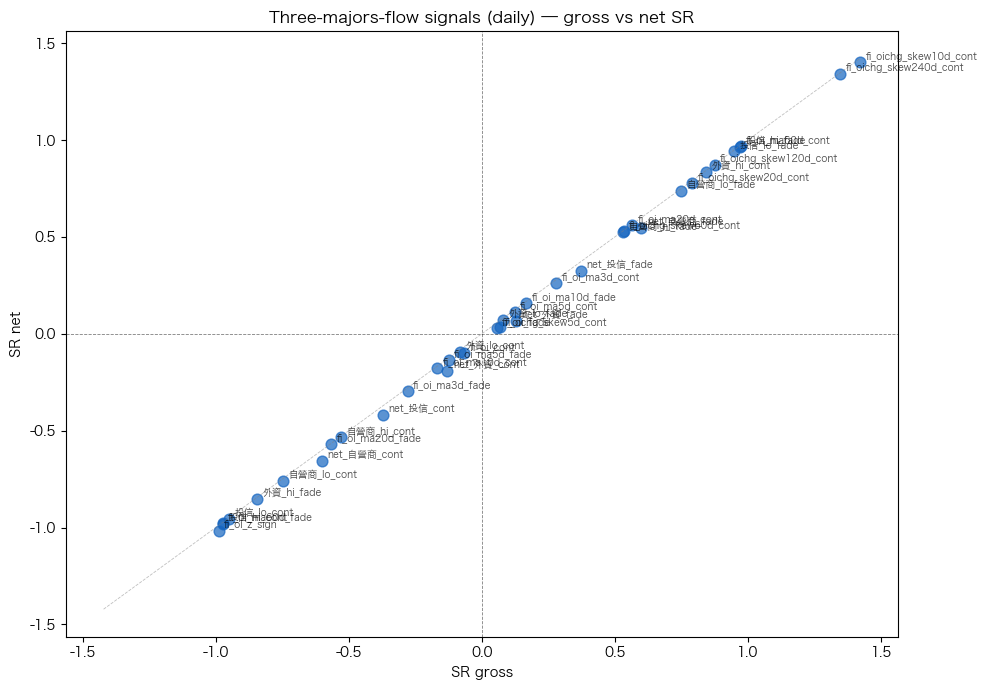


Top net-SR signal: fi_oichg_skew10d_cont


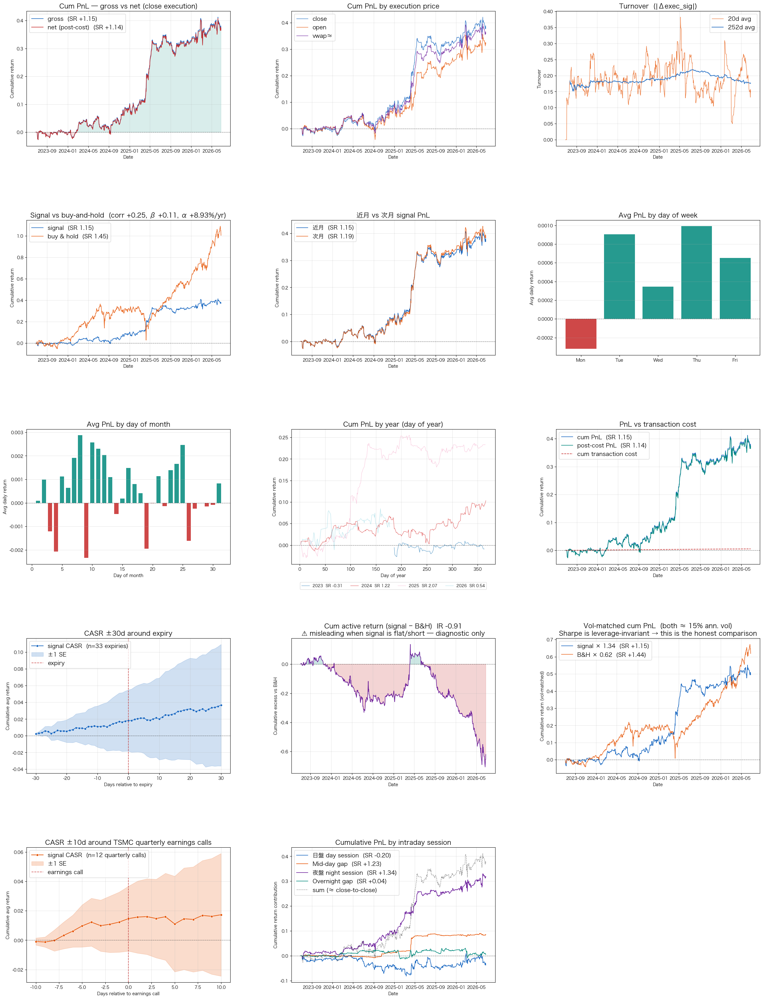

{'asset_obj': BaseAsset  MTX
   time_granularity : 1d
   bars             : 730
   start            : 2023-06-26
   end              : 2026-06-26
 
                open     high      low    close    volume  settlement       oi  \
 date                                                                            
 2023-06-26  16850.0  16915.0  16823.0  16875.0  109676.0     16880.0  38081.0   
 2023-06-27  16801.0  16856.0  16705.0  16741.0  151250.0     16742.0  40896.0   
 2023-06-28  16804.0  16810.0  16712.0  16773.0  123995.0     16775.0  40560.0   
 2023-06-29  16846.0  16965.0  16733.0  16755.0  187804.0     16762.0  41505.0   
 2023-06-30  16714.0  16826.0  16670.0  16790.0  135614.0     16787.0  40808.0   
 ...             ...      ...      ...      ...       ...         ...      ...   
 2026-06-22  47439.0  48467.0  47369.0  48445.0  124615.0     48428.0  32470.0   
 2026-06-23  48800.0  48866.0  47408.0  47440.0  165543.0     47437.0  32850.0   
 2026-06-24  46820.0  47060.0  4

In [26]:
ALL = {**raw_signals, **smoothed_signals, **trade_signals,
       **skew_signals, **extreme_signals}
tbl = summarize(ALL)
display(tbl)

fig, ax = plt.subplots(figsize=(10, 7))
ax.scatter(tbl["SR_gross"], tbl["SR_net"], s=60, alpha=0.7, color="#1565c0")
for nm, row in tbl.iterrows():
    ax.annotate(nm, (row["SR_gross"], row["SR_net"]),
                fontsize=7, alpha=0.7, xytext=(4,2), textcoords="offset points")
ax.axhline(0, color="black", lw=0.6, ls="--", alpha=0.5)
ax.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
lim = max(abs(tbl[["SR_gross","SR_net"]].values).max(), 1.0)
ax.plot([-lim, lim], [-lim, lim], color="grey", lw=0.6, ls="--", alpha=0.5)
ax.set_xlabel("SR gross"); ax.set_ylabel("SR net")
ax.set_title("Three-majors-flow signals (daily) — gross vs net SR")
plt.tight_layout(); plt.show()

print(f"\nTop net-SR signal: {tbl.index[0]}")
cta.Simulate(ALL[tbl.index[0]], time_granularity="1d", normalize=False)

# Test Different Ratios

In [27]:
net_foreign = cta.load_three_majors(PRODUCT, "外資", "net_lots").astype(float)
net_local = cta.load_three_majors(PRODUCT, "投信", "net_lots").astype(float)
net_self_trading = cta.load_three_majors(PRODUCT, "自營商", "net_lots").astype(float)

In [28]:
def plot_simple(oi):
    z   = (oi - oi.rolling(60, min_periods=10).mean()) / oi.rolling(60, min_periods=10).std()
    raw = cta.InstRank(252, cta.InstMean(60, np.tanh(z)))-0.5
    z_sign = cta.Sign(z)
    
    raw_signals = {
        "oi_cont":  raw.rename("oi_cont"),
        "oi_fade": (-raw).rename("oi_fade"),
        "oi_z_sign": z_sign.rename("oi_sin")
    }
    display(summarize(raw_signals))
    
    cta.SimulateAll(*raw_signals.values(), names=list(raw_signals.keys()),
                    time_granularity="1d", normalize=True)

,SR_gross,SR_net,cum_gross_pct,cum_net_pct,held_pct,turnover_avg
oi_fade,0.656,0.653,10.519,10.460,72.403,0.025
oi_z_sign,0.226,0.185,12.124,9.892,98.214,0.927
oi_cont,-0.656,-0.660,-10.519,-10.578,72.403,0.025


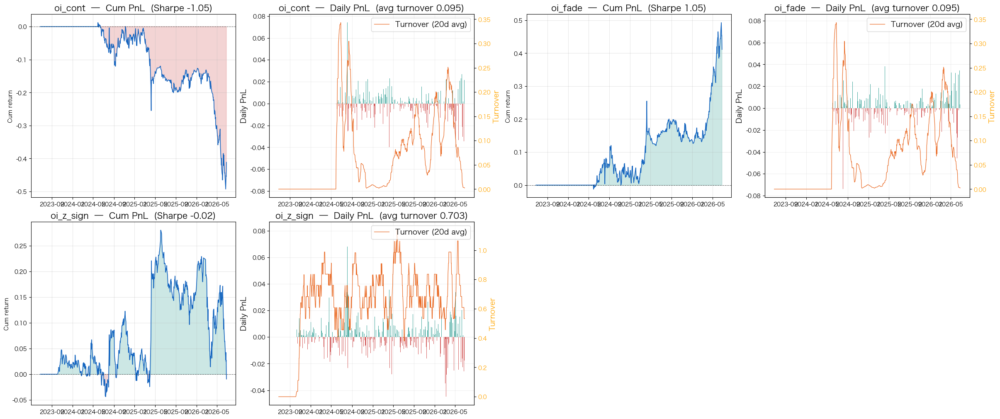

In [29]:
net_foreign_local_ratio = net_foreign / net_local
plot_simple(net_foreign_local_ratio)


## 7. Systematic sweep — every signal family × every identity

Earlier sections only used 外資 (foreign). Loop over all three: 外資 / 投信 / 自營商 — same construction across each. Five signal families:

1. **Raw OI z-score** (60d rolling)
2. **Smoothed OI** via `InstMean(20, ...)` then z-score
3. **Daily net-trade** tanh-scaled
4. **InstSkew(60)** of daily OI changes
5. **InstRank(120) > 0.98** — extreme-tail event

Each family × identity × direction (cont/fade) = 30 signals.

built 36 signals across 3 identities × 5 families × 2 signs (+ hi/lo for ranks)


,SR_gross,SR_net,cum_gross_pct,cum_net_pct,held_pct,turnover_avg
投信_hi_fade,0.972,0.962,7.788,7.702,2.110,0.036
投信_lo_fade,0.949,0.941,8.865,8.780,2.110,0.036
投信_oichg_skew60_cont,0.899,0.896,34.534,34.430,94.481,0.044
自營商_oichg_skew60_fade,0.848,0.845,30.286,30.200,94.481,0.036
外資_hi_cont,0.843,0.833,5.734,5.663,1.461,0.029
自營商_lo_fade,0.747,0.735,7.276,7.152,3.084,0.052
自營商_net_fade,0.600,0.546,19.899,18.101,98.214,0.747
外資_oichg_skew60_fade,0.533,0.528,8.133,8.048,91.234,0.036
自營商_hi_fade,0.529,0.523,9.092,8.993,2.110,0.042
外資_oi_ma20_cont,0.494,0.489,18.049,17.874,96.104,0.073


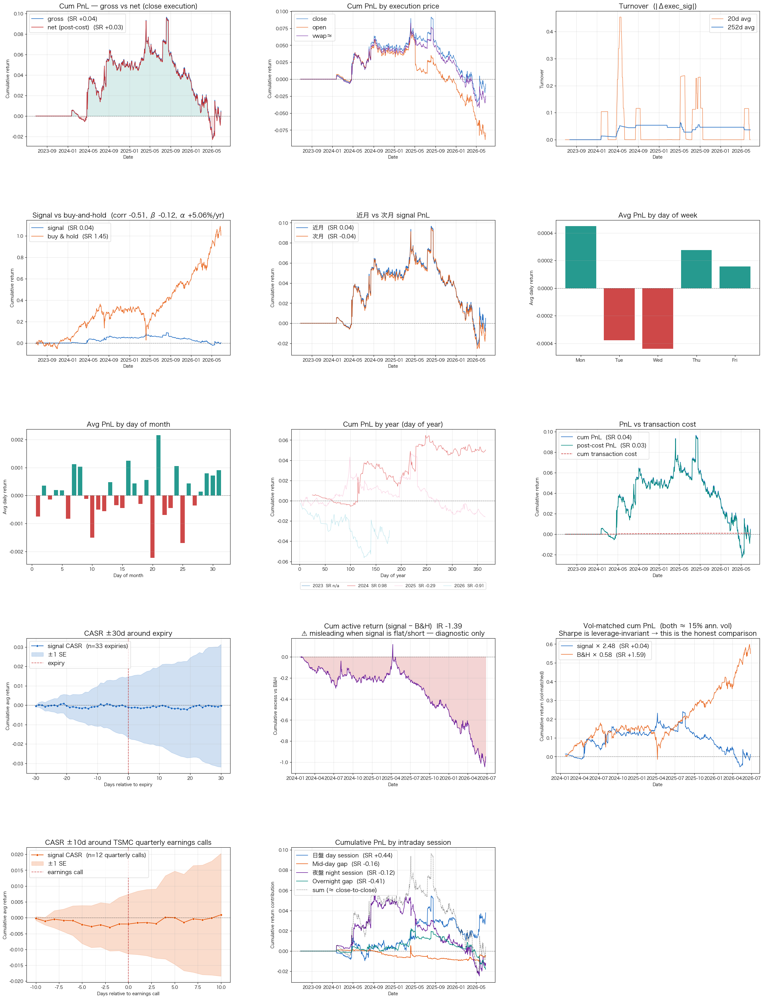

{'asset_obj': BaseAsset  MTX
   time_granularity : 1d
   bars             : 730
   start            : 2023-06-26
   end              : 2026-06-26
 
                open     high      low    close    volume  settlement       oi  \
 date                                                                            
 2023-06-26  16850.0  16915.0  16823.0  16875.0  109676.0     16880.0  38081.0   
 2023-06-27  16801.0  16856.0  16705.0  16741.0  151250.0     16742.0  40896.0   
 2023-06-28  16804.0  16810.0  16712.0  16773.0  123995.0     16775.0  40560.0   
 2023-06-29  16846.0  16965.0  16733.0  16755.0  187804.0     16762.0  41505.0   
 2023-06-30  16714.0  16826.0  16670.0  16790.0  135614.0     16787.0  40808.0   
 ...             ...      ...      ...      ...       ...         ...      ...   
 2026-06-22  47439.0  48467.0  47369.0  48445.0  124615.0     48428.0  32470.0   
 2026-06-23  48800.0  48866.0  47408.0  47440.0  165543.0     47437.0  32850.0   
 2026-06-24  46820.0  47060.0  4

In [33]:
IDENTITIES = ["外資", "投信", "自營商"]

def _z(s, win=60):
    return (s - s.rolling(win, min_periods=10).mean()) / s.rolling(win, min_periods=10).std()

all_id_signals = {}

for who in IDENTITIES:
    oi  = cta.load_three_majors(PRODUCT, who, "oi_net_lots").astype(float)
    net = cta.load_three_majors(PRODUCT, who, "net_lots").astype(float)

    # 1. Raw OI z-score
    s = np.tanh(_z(oi, 60))
    all_id_signals[f"{who}_oi_z_cont"]  =  s.rename(f"{who}_oi_z_cont")
    all_id_signals[f"{who}_oi_z_fade"]  = (-s).rename(f"{who}_oi_z_fade")

    # 2. InstMean-smoothed OI
    s = np.tanh(_z(cta.InstMean(20, oi), 60))
    all_id_signals[f"{who}_oi_ma20_cont"] =  s.rename(f"{who}_oi_ma20_cont")
    all_id_signals[f"{who}_oi_ma20_fade"] = (-s).rename(f"{who}_oi_ma20_fade")

    # 3. Daily net-trade
    s = np.tanh(net / net.rolling(20, min_periods=5).std())
    all_id_signals[f"{who}_net_cont"] =  s.rename(f"{who}_net_cont")
    all_id_signals[f"{who}_net_fade"] = (-s).rename(f"{who}_net_fade")

    # 4. InstSkew of daily OI changes
    s = np.tanh(cta.InstSkew(60, oi.diff()))
    all_id_signals[f"{who}_oichg_skew60_cont"] =  s.rename(f"{who}_oichg_skew60_cont")
    all_id_signals[f"{who}_oichg_skew60_fade"] = (-s).rename(f"{who}_oichg_skew60_fade")

    # 5. InstRank > 0.98 — extreme-tail events
    hi = (cta.InstRank(120,  net) > 0.98).astype(float)
    lo = (cta.InstRank(120, -net) > 0.98).astype(float)
    all_id_signals[f"{who}_hi_cont"] =  hi.rename(f"{who}_hi_cont")
    all_id_signals[f"{who}_hi_fade"] = (-hi).rename(f"{who}_hi_fade")
    all_id_signals[f"{who}_lo_cont"] = (-lo).rename(f"{who}_lo_cont")
    all_id_signals[f"{who}_lo_fade"] =  lo.rename(f"{who}_lo_fade")

print(f"built {len(all_id_signals)} signals across {len(IDENTITIES)} identities × 5 families × 2 signs (+ hi/lo for ranks)")
display(summarize(all_id_signals).head(20))
cta.simulate(all_id_signals['投信_lo_fade'], time_granularity="1d", normalize=True)

## 8. Cross-identity ratios + `InstMean` smoothing

The three identities don't move independently — 外資 long while 自營商 short is a different regime from all three long. Encode the *relationship* directly via ratios and differences.

Six base ratios on `oi_net_lots`:
* `外資 / 投信`, `外資 / 自營商`, `投信 / 自營商`
* `外資 - 自營商` and `外資 - 投信` (absolute differences, since OI is signed)
* `外資 share` = 外資 / (|外資| + |投信| + |自營商|)

Each ratio is z-scored over 60d, tanh-bounded, then also smoothed with `InstMean(N)` for `N ∈ {5, 20, 60}` — testing whether the slow change of the ratio is more informative than the spot value.

In [34]:
oi = {who: cta.load_three_majors(PRODUCT, who, "oi_net_lots").astype(float)
      for who in IDENTITIES}

eps = 1.0

ratios_raw = {
    "ratio_外資_div_投信":   oi["外資"]   / oi["投信"].replace(0, np.nan),
    "ratio_外資_div_自營商": oi["外資"]   / oi["自營商"].replace(0, np.nan),
    "ratio_投信_div_自營商": oi["投信"]   / oi["自營商"].replace(0, np.nan),
    "diff_外資_minus_自營商": oi["外資"]  - oi["自營商"],
    "diff_外資_minus_投信":   oi["外資"]  - oi["投信"],
    "share_外資":             oi["外資"].abs() /
                              (oi["外資"].abs() + oi["投信"].abs() + oi["自營商"].abs() + eps),
}

ratio_signals = {}
for name, raw in ratios_raw.items():
    raw = raw.replace([np.inf, -np.inf], np.nan)

    # (a) Spot: z-score → tanh
    s = np.tanh(_z(raw, 60))
    ratio_signals[f"{name}_spot_cont"] =  s.rename(f"{name}_spot_cont")
    ratio_signals[f"{name}_spot_fade"] = (-s).rename(f"{name}_spot_fade")

    # (b) InstMean-smoothed at multiple windows
    for N in [5, 20, 60]:
        smooth = cta.InstMean(N, raw)
        s = np.tanh(_z(smooth, 60))
        ratio_signals[f"{name}_ma{N}_cont"] =  s.rename(f"{name}_ma{N}_cont")
        ratio_signals[f"{name}_ma{N}_fade"] = (-s).rename(f"{name}_ma{N}_fade")

print(f"built {len(ratio_signals)} ratio signals "
      f"({len(ratios_raw)} ratios × 4 smoothings × 2 signs)")
display(summarize(ratio_signals).head(20))

built 48 ratio signals (6 ratios × 4 smoothings × 2 signs)


,SR_gross,SR_net,cum_gross_pct,cum_net_pct,held_pct,turnover_avg
ratio_外資_div_投信_ma60_cont,0.939,0.937,41.411,41.308,93.182,0.044
diff_外資_minus_自營商_ma60_cont,0.898,0.896,38.446,38.357,93.182,0.036
diff_外資_minus_投信_ma60_cont,0.878,0.876,39.093,39.006,93.506,0.036
share_外資_spot_cont,0.881,0.846,30.643,29.416,98.052,0.509
ratio_外資_div_投信_ma20_cont,0.638,0.633,22.237,22.053,96.266,0.077
ratio_投信_div_自營商_ma20_fade,0.636,0.631,22.206,22.028,96.104,0.073
ratio_外資_div_自營商_spot_fade,0.514,0.488,10.962,10.425,96.591,0.225
diff_外資_minus_投信_ma20_cont,0.484,0.479,17.723,17.548,96.104,0.073
ratio_外資_div_自營商_ma60_cont,0.403,0.399,14.591,14.462,93.506,0.053
ratio_外資_div_自營商_ma20_fade,0.386,0.382,15.204,15.059,96.429,0.061


## 9. Combined top-table across everything (per-identity + ratios)

Merge `all_id_signals` + `ratio_signals` + the earlier per-section dicts, sort by net SR, and run the full daily-Sharpe dashboard on the headline winner.

total: 109 signals


,SR_gross,SR_net,cum_gross_pct,cum_net_pct,held_pct,turnover_avg
fi_oichg_skew10d_cont,1.421,1.401,33.149,32.692,98.052,0.189
fi_oichg_skew240d_cont,1.346,1.342,7.401,7.382,79.058,0.008
fi_oi_ma60d_cont,0.973,0.971,40.639,40.560,85.227,0.033
投信_hi_fade,0.972,0.962,7.788,7.702,2.110,0.036
投信_lo_fade,0.949,0.941,8.865,8.780,2.110,0.036
ratio_外資_div_投信_ma60_cont,0.939,0.937,41.411,41.308,93.182,0.044
diff_外資_minus_自營商_ma60_cont,0.898,0.896,38.446,38.357,93.182,0.036
投信_oichg_skew60_cont,0.899,0.896,34.534,34.430,94.481,0.044
diff_外資_minus_投信_ma60_cont,0.878,0.876,39.093,39.006,93.506,0.036
fi_oichg_skew120d_cont,0.875,0.870,6.672,6.631,86.688,0.018


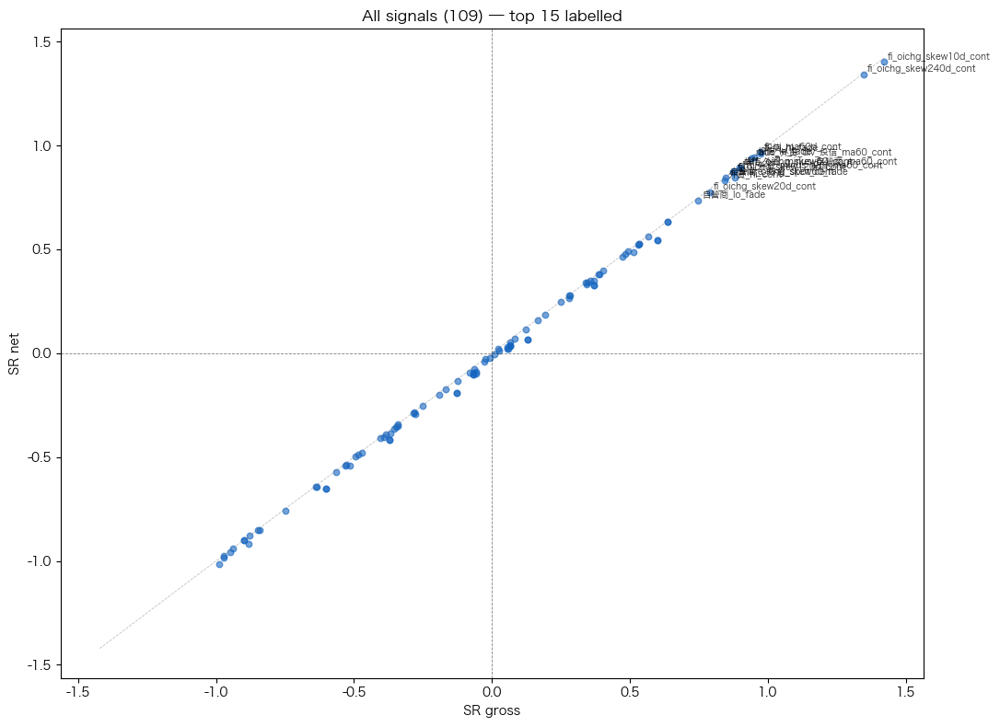


Top by SR_net: fi_oichg_skew10d_cont


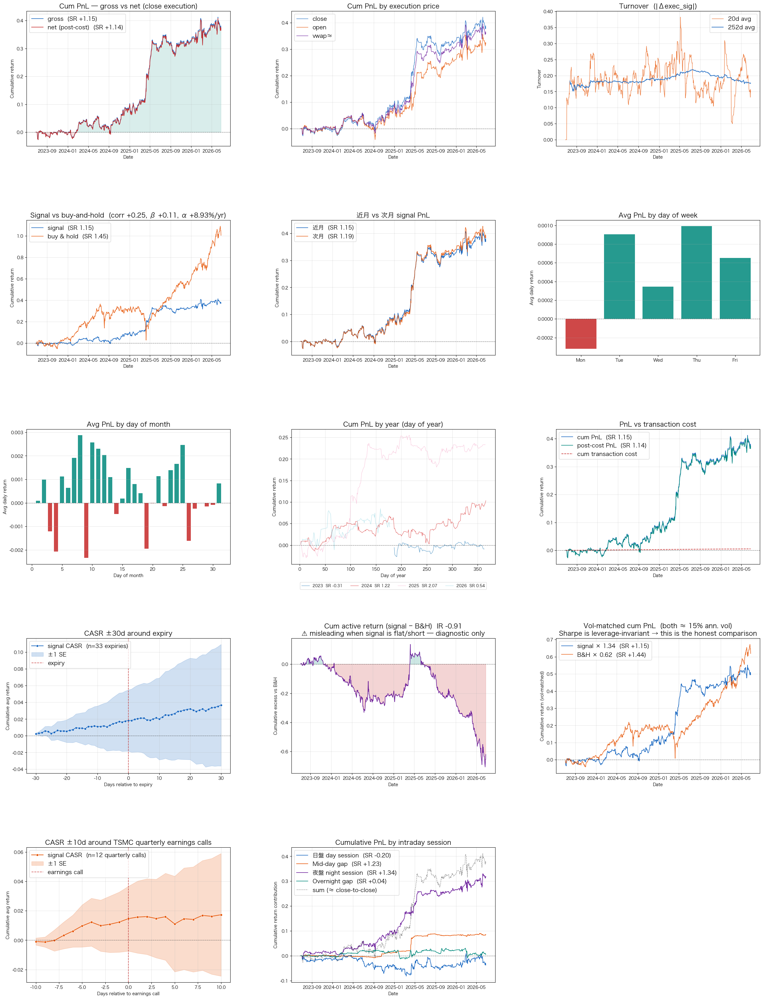

{'asset_obj': BaseAsset  MTX
   time_granularity : 1d
   bars             : 730
   start            : 2023-06-26
   end              : 2026-06-26
 
                open     high      low    close    volume  settlement       oi  \
 date                                                                            
 2023-06-26  16850.0  16915.0  16823.0  16875.0  109676.0     16880.0  38081.0   
 2023-06-27  16801.0  16856.0  16705.0  16741.0  151250.0     16742.0  40896.0   
 2023-06-28  16804.0  16810.0  16712.0  16773.0  123995.0     16775.0  40560.0   
 2023-06-29  16846.0  16965.0  16733.0  16755.0  187804.0     16762.0  41505.0   
 2023-06-30  16714.0  16826.0  16670.0  16790.0  135614.0     16787.0  40808.0   
 ...             ...      ...      ...      ...       ...         ...      ...   
 2026-06-22  47439.0  48467.0  47369.0  48445.0  124615.0     48428.0  32470.0   
 2026-06-23  48800.0  48866.0  47408.0  47440.0  165543.0     47437.0  32850.0   
 2026-06-24  46820.0  47060.0  4

In [35]:
COMBINED = {**all_id_signals, **ratio_signals,
            **raw_signals, **smoothed_signals, **trade_signals,
            **skew_signals}
print(f"total: {len(COMBINED)} signals")

tbl_full = summarize(COMBINED)
display(tbl_full.head(20))

# Headline scatter, all signals
fig, ax = plt.subplots(figsize=(11, 8))
ax.scatter(tbl_full["SR_gross"], tbl_full["SR_net"], s=22, alpha=0.6, color="#1565c0")
top = tbl_full.head(15)
for nm, row in top.iterrows():
    ax.annotate(nm, (row["SR_gross"], row["SR_net"]),
                fontsize=7, alpha=0.8, xytext=(3,2), textcoords="offset points")
ax.axhline(0, color="black", lw=0.6, ls="--", alpha=0.5)
ax.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
lim = max(abs(tbl_full[["SR_gross","SR_net"]].values).max(), 1.0)
ax.plot([-lim, lim], [-lim, lim], color="grey", lw=0.6, ls="--", alpha=0.5)
ax.set_xlabel("SR gross"); ax.set_ylabel("SR net")
ax.set_title(f"All signals ({len(COMBINED)}) — top 15 labelled")
plt.tight_layout(); plt.show()

print(f"\nTop by SR_net: {tbl_full.index[0]}")
cta.Simulate(COMBINED[tbl_full.index[0]], time_granularity="1d", normalize=False)